<a href="https://colab.research.google.com/github/sergienko4/deep-learing/blob/main/ex7/ex7.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Deep Learning: Ex.7 - **Object detection**

Submitted by: [... **your name and ID** ...]



In [1]:
# TensorFlow and tf.keras
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import load_model

import tensorflow_hub as hub  # <---- https://tfhub.dev


# Helper libraries
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle, Arrow  # <---- to draw rectangles 

---
### 1. Object detection

Let's pick one of the `Faster R-CNN` models from TF-Hub:
 https://tfhub.dev/tensorflow/faster_rcnn/inception_resnet_v2_640x640/1

As mentioned in this URL (check it), the model was trained on the **COCO 2017 dataset**. You will need the class labels of this dataset, which is provided in the 
`mscoco_label_map.pbtxt` file. Upload the file to your Colab notebook (drag-and-drop) and use the following code to extract the labels from it.


In [2]:
model = hub.load("https://tfhub.dev/tensorflow/faster_rcnn/inception_resnet_v2_640x640/1")

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
drive_base_path = '/content/drive/MyDrive/ex7/'

In [5]:
!ls '/content/drive/MyDrive/ex7/'

bugs.jpg  dog.jpg  giraffe.jpg	kids.jpg  mscoco_label_map.pbtxt  person.jpg


In [6]:
def read_label_map(label_map_path):
    item_id = None
    item_name = None
    items = {}
    with open(label_map_path, "r") as file:
        for line in file:
            line.replace(" ", "")
            if line == "item{":
                pass
            elif line == "}":
                pass
            elif "id" in line:
                item_id = int(line.split(":", 1)[1].strip())
            elif "display_name" in line:
                item_name = line.split(":", 1)[1].replace("\"", "").strip()

            if item_id is not None and item_name is not None:
                items[item_id] = item_name
                item_id = None
                item_name = None
    return items
# load "mscoco" labels
labels =  read_label_map(f'{drive_base_path}mscoco_label_map.pbtxt')

- Load and run the trained model for each of the images given in this exercise.

- For each image, plot a graph of the detection scores.

- For each image, set a minimal score threshold, and plot the final image with the detected objects (marked with their class name and score).


In [7]:
COCO17_HUMAN_POSE_KEYPOINTS = [(0, 1),
 (0, 2),
 (1, 3),
 (2, 4),
 (0, 5),
 (0, 6),
 (5, 7),
 (7, 9),
 (6, 8),
 (8, 10),
 (5, 6),
 (5, 11),
 (6, 12),
 (11, 12),
 (11, 13),
 (13, 15),
 (12, 14),
 (14, 16)]

In [8]:
def print_pic_with_key_poins_if_person(detector_runner, image, num_detection_boxes, num_detection_classes=20, fig_size=(20,16), min_score_thresh=0.5):
  converted_img  = tf.image.convert_image_dtype(img, tf.uint8)[tf.newaxis, ...]
  result = detector_runner(converted_img)
  size=len(result.keys())
  
  detection_boxes = result['detection_boxes'].numpy()[0,...]
  detection_scores = result['detection_scores'].numpy()[0,...]
  detection_boxes = detection_boxes[:num_detection_boxes,:]
  detection_classes = result['detection_classes'].numpy().astype(np.int)[0,:]

  has_keypoints = 'detection_keypoints' in result
  if(has_keypoints):
    detection_keypoints=result['detection_keypoints'].numpy()[0,...]
    detection_keypoint_scores=result['detection_keypoint_scores'].numpy()[0,...]
  
  plt.figure(figsize=(12,4))
  plt.plot(detection_scores,'.:')
  plt.grid()

  im_h, im_w, _ = img.shape
  plt.figure(figsize=fig_size)
  plt.imshow(img)
  
  #box
  for i in range(size):
    if detection_scores[i]>min_score_thresh:
      ymin, xmin, ymax, xmax = detection_boxes[i]

      box_x = int(xmin * im_w)
      box_y = int(ymin * im_h)
      box_w = int((xmax-xmin) * im_w)
      box_h = int((ymax-ymin) * im_h)
      
      if has_keypoints:
        konnection_points=detection_keypoints[i]
      ax = plt.gca()
      ax.add_patch(Rectangle((box_x, box_y), box_w, box_h, linewidth=5, edgecolor='r', facecolor='none'))

      txt = "{}: {}%".format(labels[detection_classes[i]], int(100 * detection_scores[i]))
      ax.annotate(txt, xy=(box_x,box_y-10),color='r', fontsize=16, weight='bold')
      
      #draw key points
      if(has_keypoints):
        for detection_keypoint_score in detection_keypoint_scores[i]:
          #remove thresh
          if (detection_keypoint_score > min_score_thresh).all():
            all_x=[]
            all_y=[]

            for x,y in konnection_points:
              ax.scatter(y*im_w, x*im_h, marker="*", s=50, linewidths=5 )
              all_x.append(x*im_h)
              all_y.append(y*im_w)

            for t_1,t_2 in  COCO17_HUMAN_POSE_KEYPOINTS:
              ax.plot([all_y[t_1],all_y[t_2]],[all_x[t_1],all_x[t_2]])
  plt.show()

In [9]:
def load_images(pics_name):
  images = []
  for name in pics_name:
    img = tf.io.read_file(f'{drive_base_path}{name}')
    img = tf.image.decode_jpeg(img, channels=3)
    images.append(img.numpy())
  return images

In [10]:
pics_name = ['kids.jpg','person.jpg','bugs.jpg', 'dog.jpg', 'giraffe.jpg' ]

In [11]:
images = load_images(pics_name)

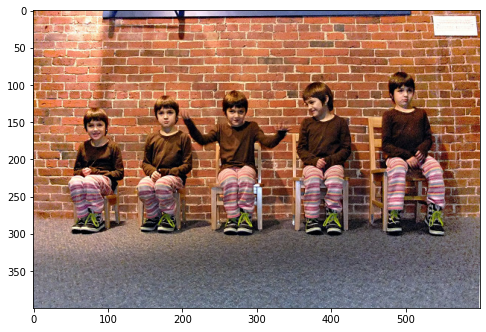

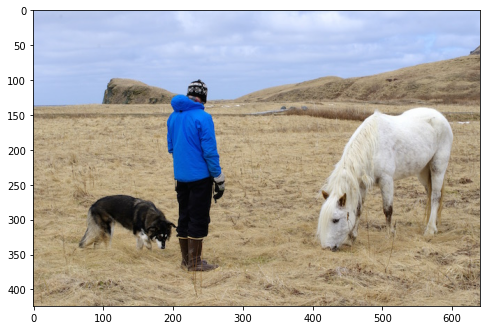

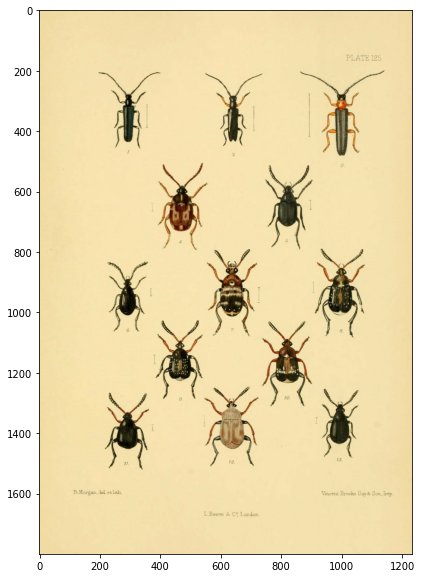

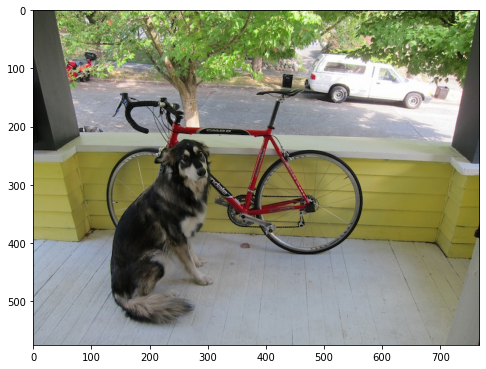

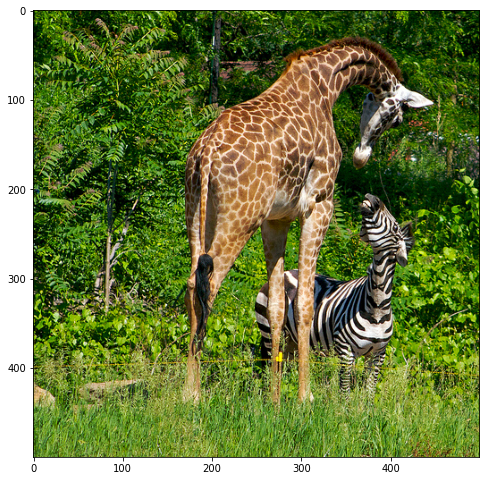

In [12]:
for img in images:
  im_h, im_w, _ = img.shape
  plt.figure(figsize=(8,10))
  plt.imshow(img) 

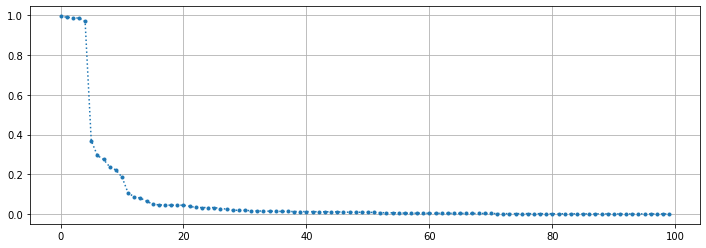

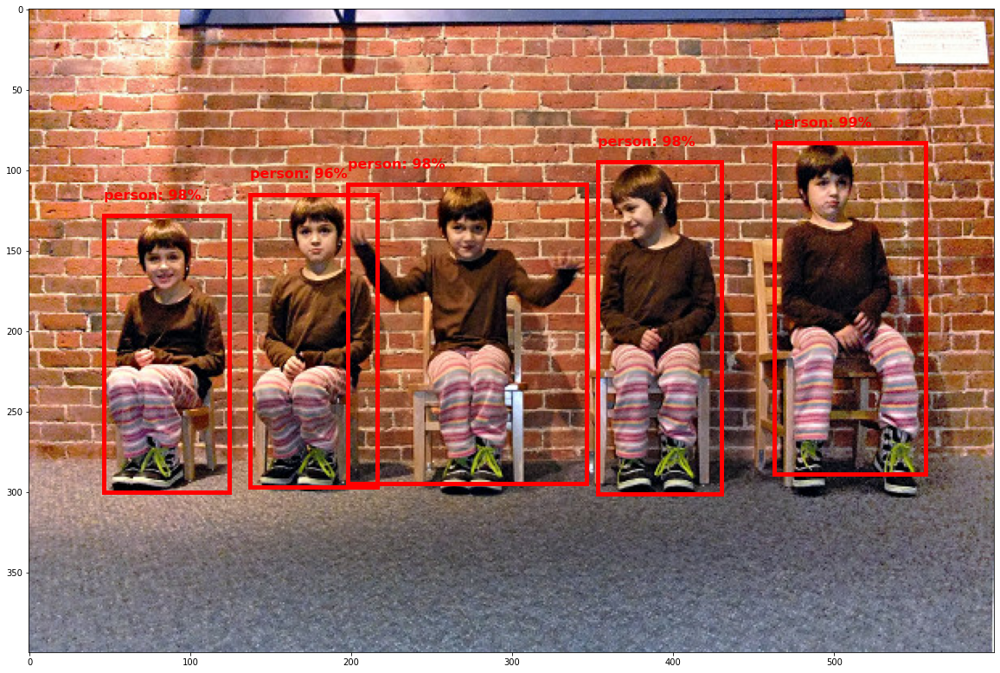

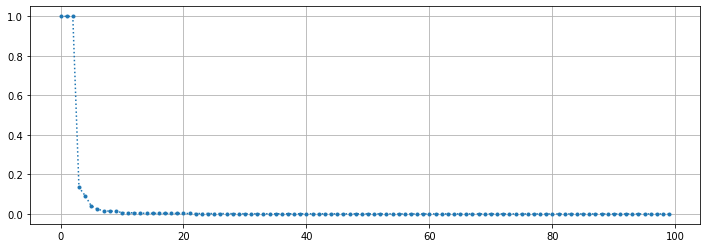

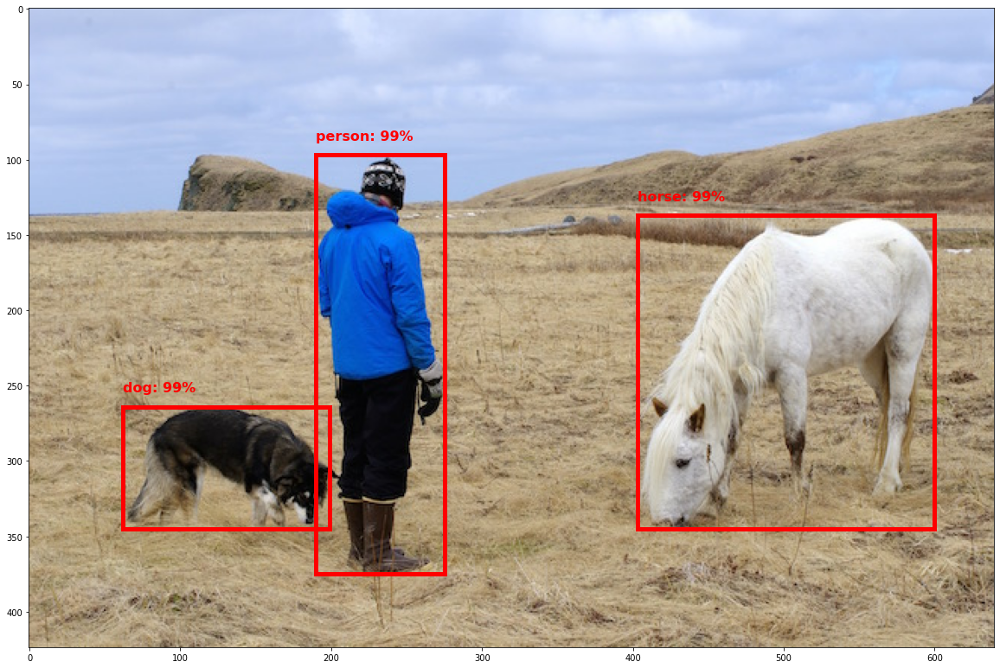

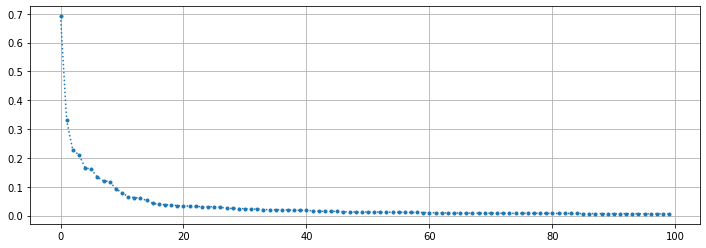

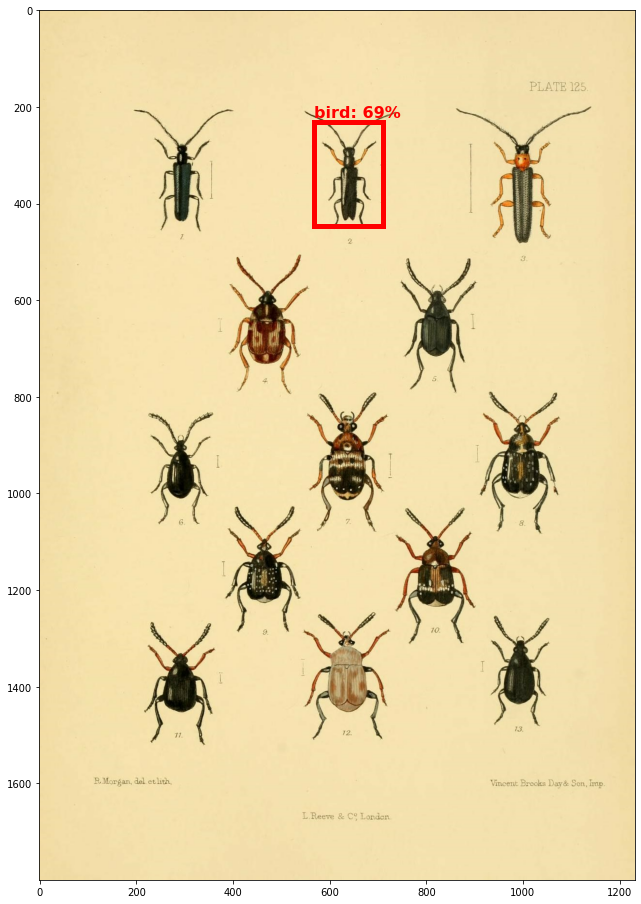

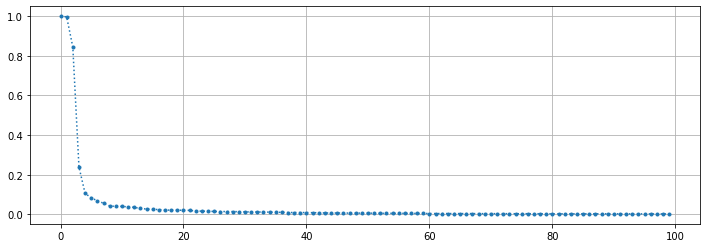

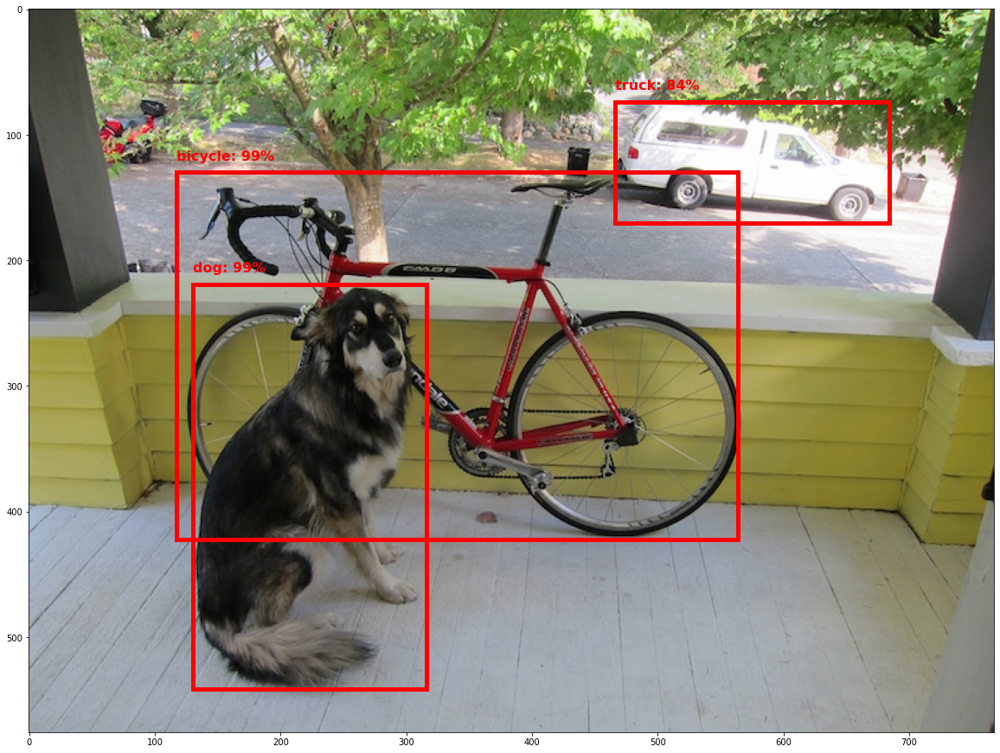

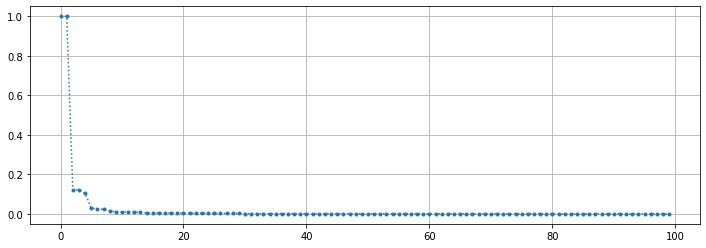

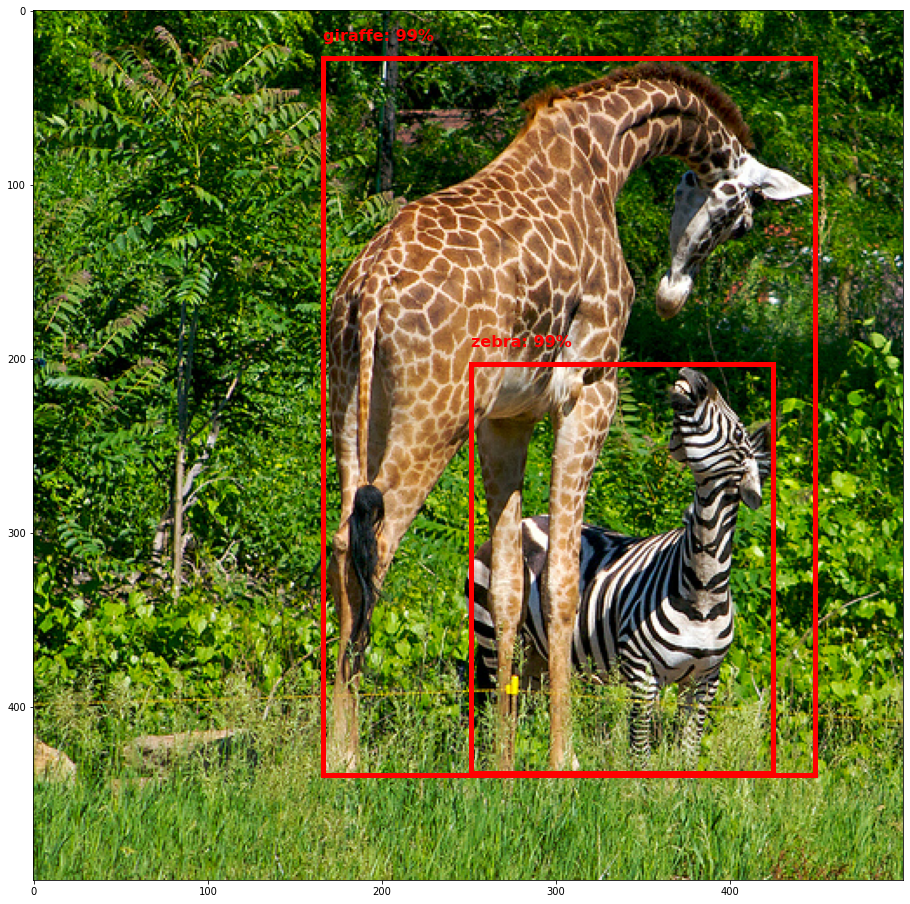

In [13]:
for img in images:
  print_pic_with_key_poins_if_person(model, img, num_detection_boxes=10, num_detection_classes=10, fig_size=(20,16), min_score_thresh=0.5)

---
### 2. Let's try a different model

As noticed, the 'bugs' image was not labeled correctly, as there is  no 'beetle' class in the MS-COCO dataset.

Let's pick a different model:
https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1

This model was trained over the **OpenImagesV4 dataset** (1.7M images with 600 object classes).

- Run this model on the 'bugs' image, and display the results.

Note that you can get the detection class names, directly from the model (see the `example use` section in the model's URL).

In [14]:
module_handle = "https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1" 

detector = hub.load(module_handle).signatures['default']


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


In [22]:
pic_name = 'bugs.jpg'
img = tf.io.read_file(f'{drive_base_path}{pic_name}')
img = tf.image.decode_jpeg(img, channels=3)
converted_img  = tf.image.convert_image_dtype(img, tf.float32)[tf.newaxis, ...]
result = detector(converted_img)
result = {key:value.numpy() for key,value in result.items()}
result.keys()


dict_keys(['detection_class_entities', 'detection_scores', 'detection_class_labels', 'detection_boxes', 'detection_class_names'])

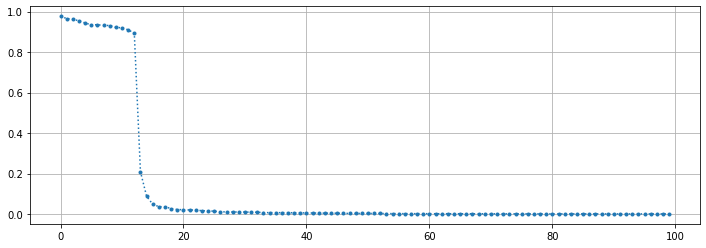

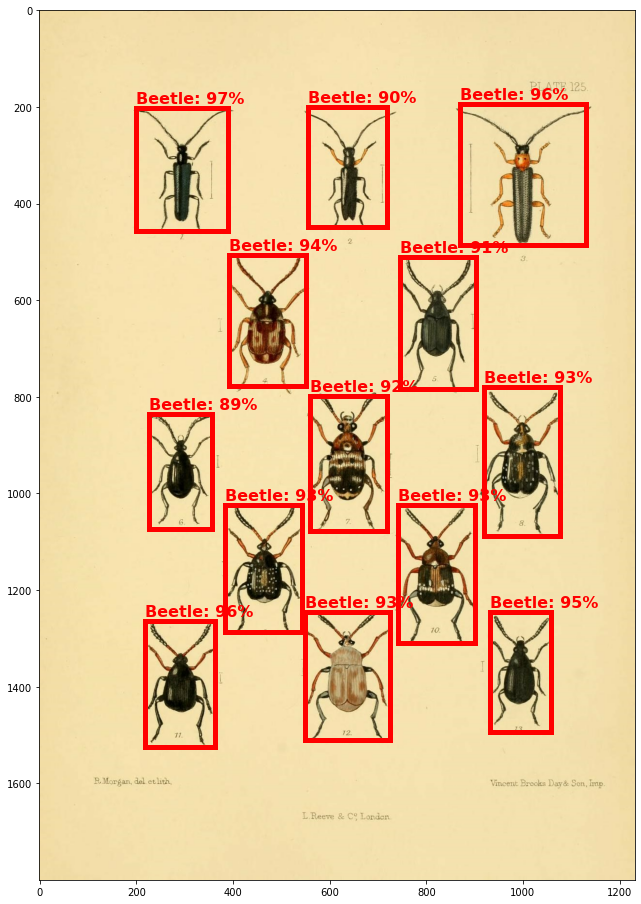

In [23]:
detection_scores = result['detection_scores']
plt.figure(figsize=(12,4))
plt.plot(detection_scores,'.:')
plt.grid()

detection_boxes = result['detection_boxes']
detection_scores = result['detection_scores']
detection_class_entities = result['detection_class_entities']

min_score_thresh = 0.5
my_detection_boxes = detection_boxes[detection_scores>min_score_thresh]
my_detection_class_entities = detection_class_entities[detection_scores>min_score_thresh]
my_detection_scores = detection_scores[detection_scores>min_score_thresh]
  
plt.figure(figsize=(20,16))
plt.imshow(img)
im_height,im_width, _ = img.shape
ax = plt.gca()
  ## append boxes to current img
for i in range(len(my_detection_boxes)):
  ymin, xmin, ymax, xmax = my_detection_boxes[i]
  box_x = xmin * im_width
  box_y = ymin * im_height
  box_w = (xmax-xmin) * im_width
  box_h = (ymax-ymin) * im_height
  # add a Rectangle patch to the Axes
  ax.add_patch(Rectangle((box_x, box_y), box_w, box_h, linewidth=5, edgecolor='r', facecolor='none'))

  txt = "{}: {}%".format(my_detection_class_entities[i].decode("ascii"), int(100 * my_detection_scores[i]))
  ax.annotate(txt, xy=(box_x,box_y-10),color='r', fontsize=16, weight='bold')
plt.show()

---
### 3. Keypoints detection

Some of the models, trained on the **MS-COCO datasets**, include not only the bounding boxes of the objects, but also a set of **17 keypoints** for each of the persons detected in the image (e.g., elbows, head, knees, hands, etc...).

Pick one such model, e.g:
https://tfhub.dev/tensorflow/centernet/resnet50v2_512x512_kpts/1

As noted in the URL, these 17 keypoints are returned as:

`detection_keypoints: a tf.float32 tensor of shape [1, N, 17, 2] containing the detected keypoints.`

- For each person detected in the image, plot its 17 keypoints. In addition, draw the "skeleton" for each person, by connecting the lines between the keypoints. Use the provided mapping: `COCO17_HUMAN_POSE_KEYPOINTS`. For example: `COCO17_HUMAN_POSE_KEYPOINTS[0] = (0,1)` means that you need to draw a line between keypoint 0 to keypoint 1. See lecture slides for details.

- Run the model and display the results, for all the images containing any persons.


In [24]:
detector = hub.load("https://tfhub.dev/tensorflow/centernet/resnet50v2_512x512_kpts/1")



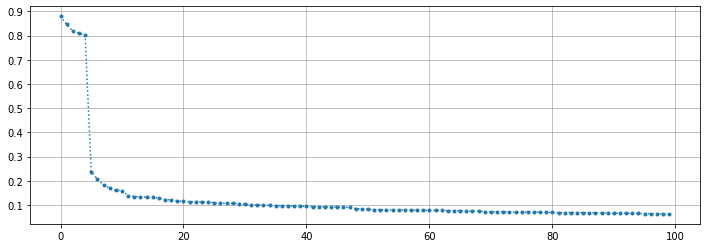

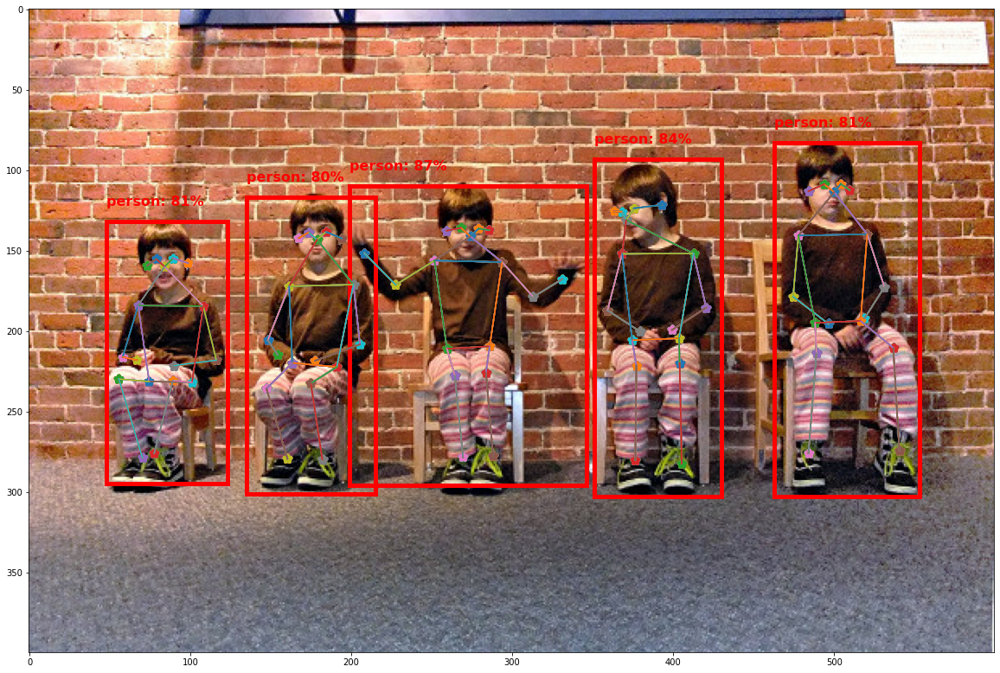

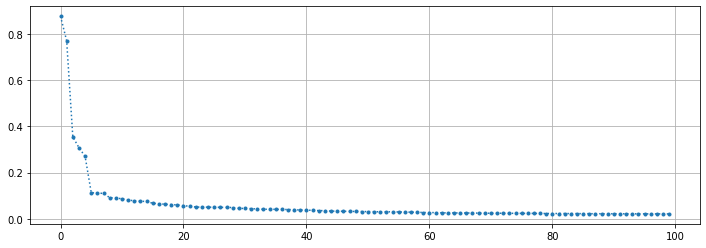

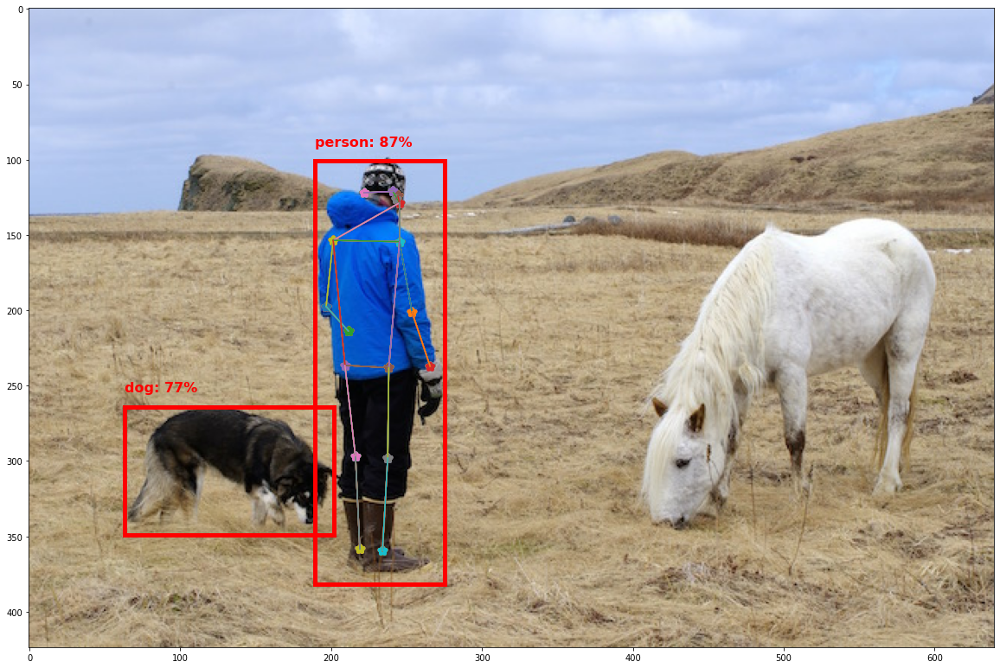

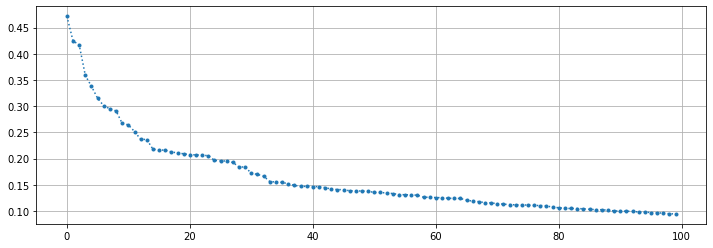

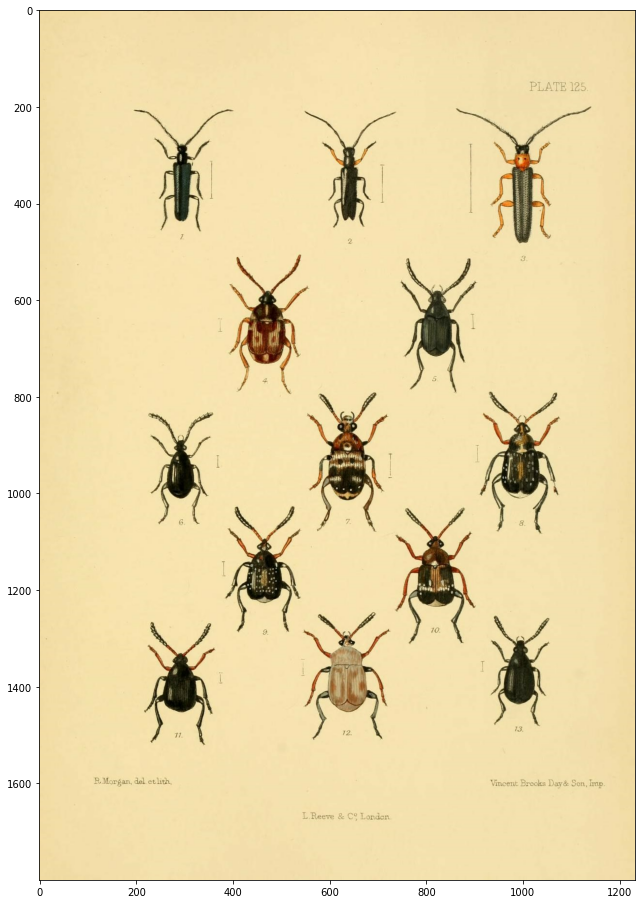

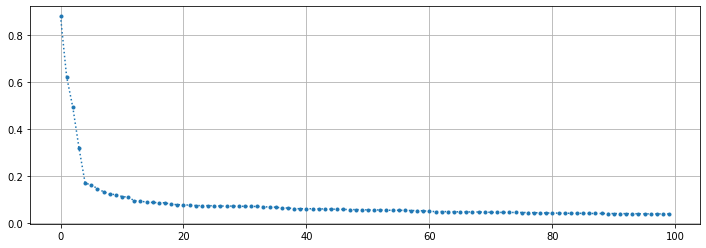

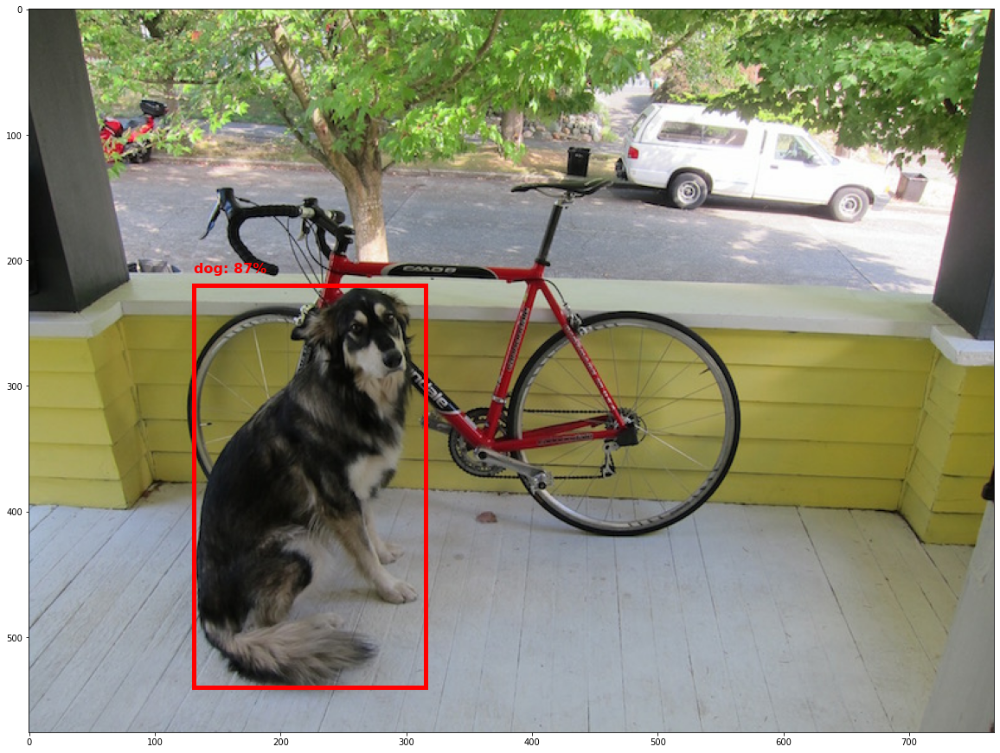

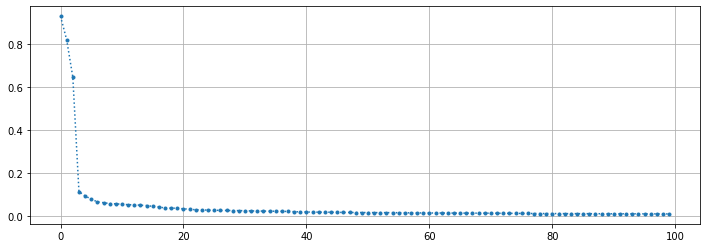

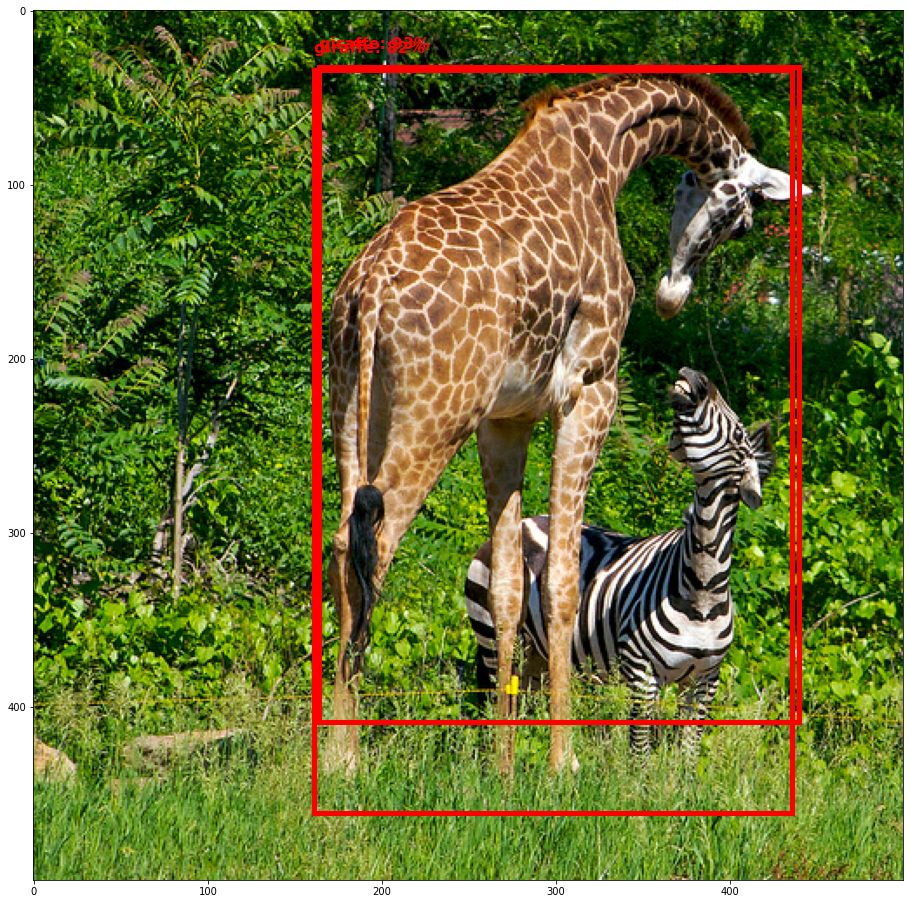

In [25]:
for img in load_images(pics_name):
  print_pic_with_key_poins_if_person(detector, img, num_detection_boxes=10, num_detection_classes=10, fig_size=(20,16), min_score_thresh=0.7)


***
## Good Luck!